In [1]:
import numpy as np
import cv2
import glob
import copy
import matplotlib.pyplot as plt
from moviepy.editor import *
from collections import deque
%matplotlib inline

In [2]:
# Camera calibration
nx = 9
ny = 6

objp = np.zeros((ny * nx, 3), np.float32)
objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
objpoints = []  # 3d points in real world
imgpoints = []  # 2d points in image


imgs = glob.glob('./camera_cal/calibration*.jpg')
for idx, filepath in enumerate(imgs):
    
    img = cv2.imread(filepath)
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    if ret == True:
        print(idx, filepath)
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        objpoints.append(objp)
        imgpoints.append(corners)

0 ./camera_cal/calibration12.jpg
1 ./camera_cal/calibration17.jpg
2 ./camera_cal/calibration20.jpg
3 ./camera_cal/calibration7.jpg
4 ./camera_cal/calibration18.jpg
5 ./camera_cal/calibration6.jpg
6 ./camera_cal/calibration15.jpg
7 ./camera_cal/calibration8.jpg
9 ./camera_cal/calibration2.jpg
10 ./camera_cal/calibration16.jpg
11 ./camera_cal/calibration11.jpg
13 ./camera_cal/calibration3.jpg
15 ./camera_cal/calibration19.jpg
16 ./camera_cal/calibration13.jpg
17 ./camera_cal/calibration10.jpg
18 ./camera_cal/calibration14.jpg
19 ./camera_cal/calibration9.jpg


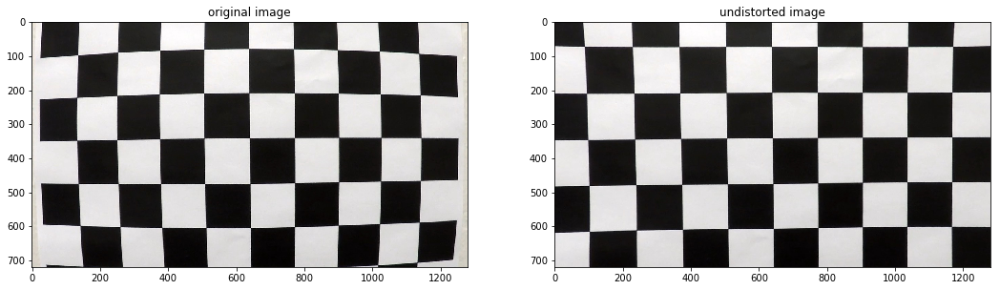

In [3]:
# Play with some example of chessboard 
test_img = cv2.imread('./camera_cal/calibration1.jpg')
test_img_size = (test_img.shape[1], test_img.shape[0])
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, test_img_size, None, None)
undist = cv2.undistort(test_img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))
ax1.imshow(cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB))
ax1.set_title('original image')
ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax2.set_title('undistorted image')

./test_images/test2.jpg
./test_images/test5.jpg
./test_images/straight_lines1.jpg
./test_images/test3.jpg
./test_images/test4.jpg
./test_images/test6.jpg
./test_images/test1.jpg
./test_images/straight_lines2.jpg


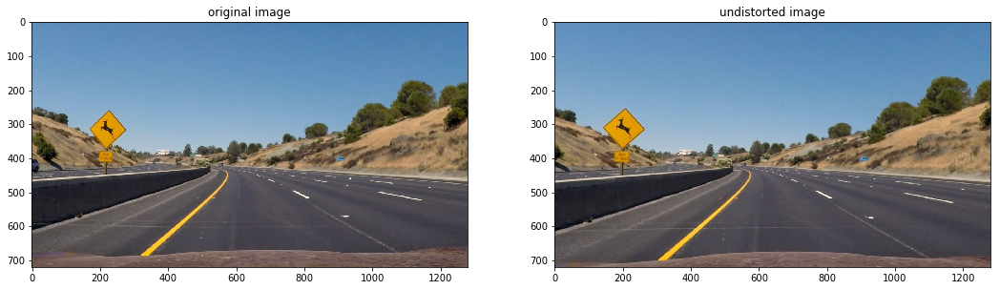

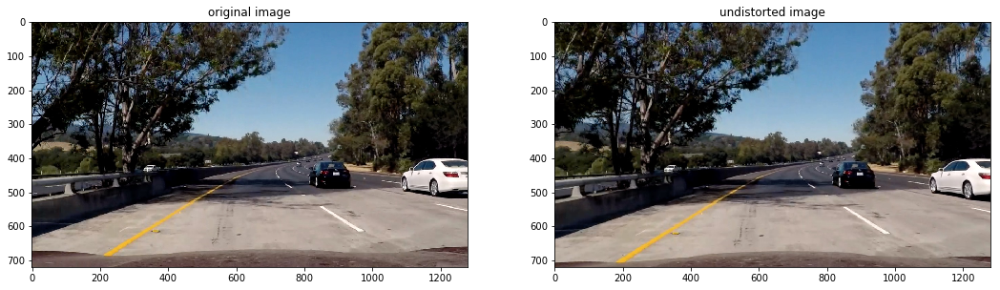

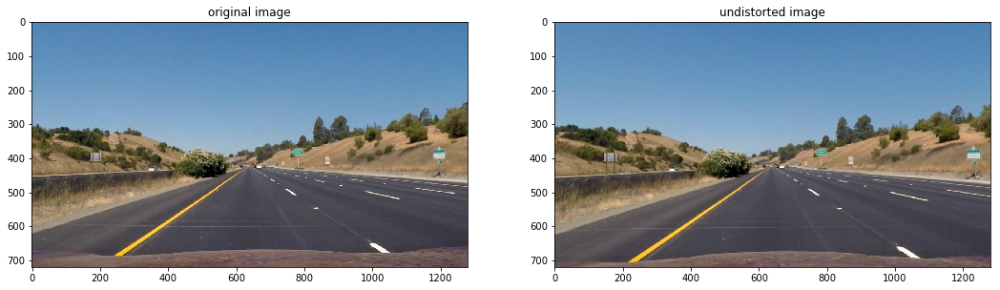

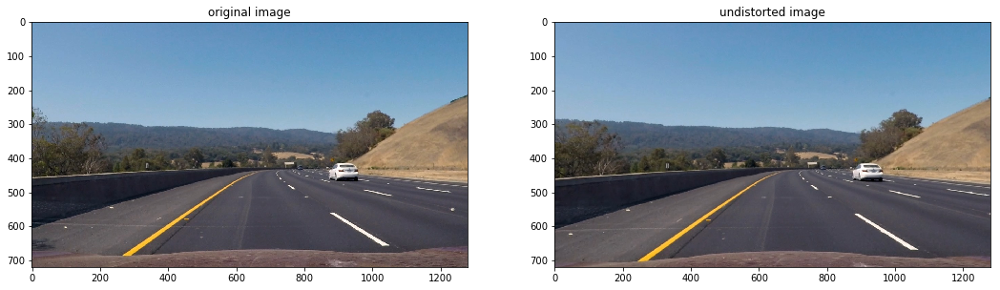

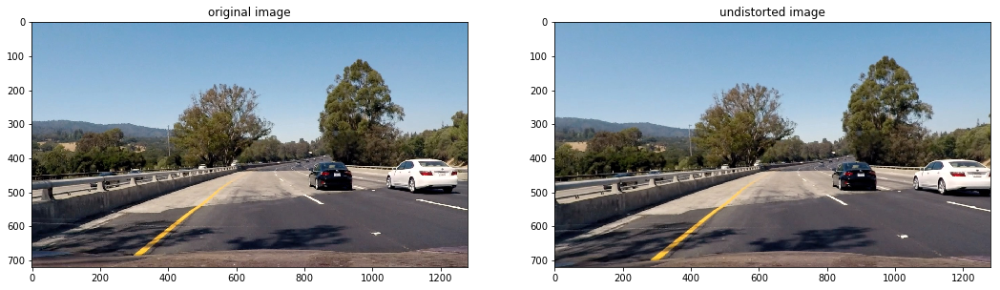

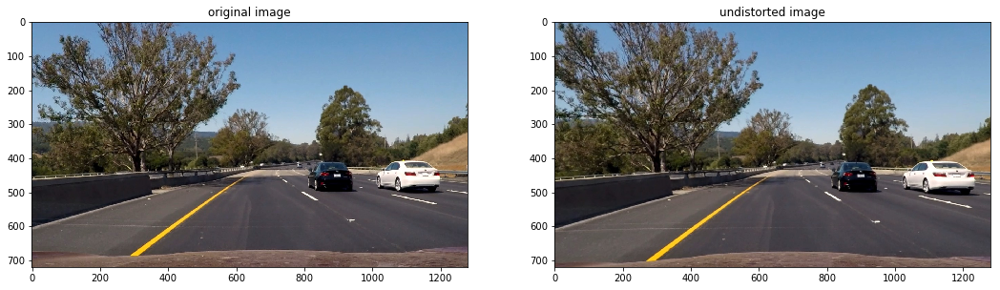

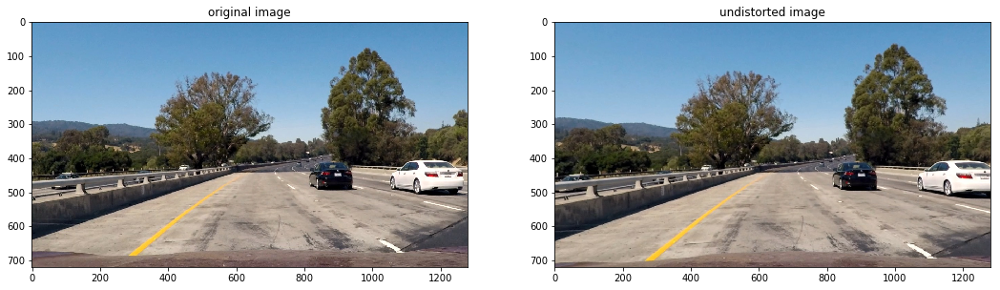

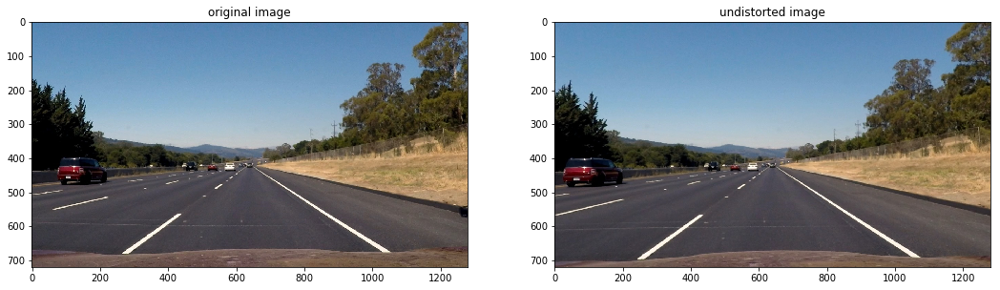

In [4]:
# Calibration for road images
img_size = (1280, 720)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
def undistort(img, verbose=1):
  img_size = (img.shape[1], img.shape[0])  # (width, height)
  #ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
  undist = cv2.undistort(img, mtx, dist, None, mtx)

  if verbose == 1:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,10))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('original image')
    ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    ax2.set_title('undistorted image')
    
  return undist
    
imgs = glob.glob('./test_images/*.jpg')
for filepath in imgs:
    print(filepath)
    img = cv2.imread(filepath)
    undistort(img)
    

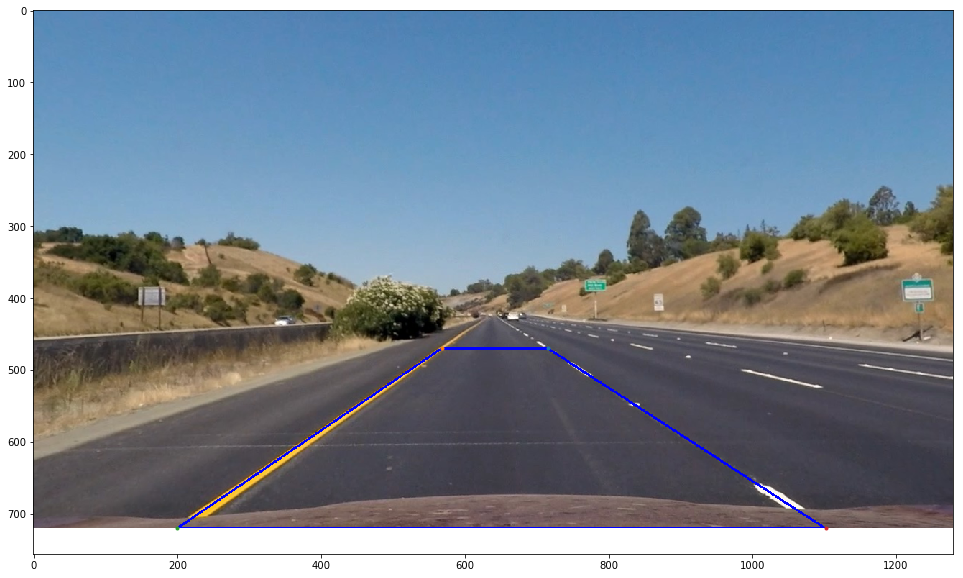

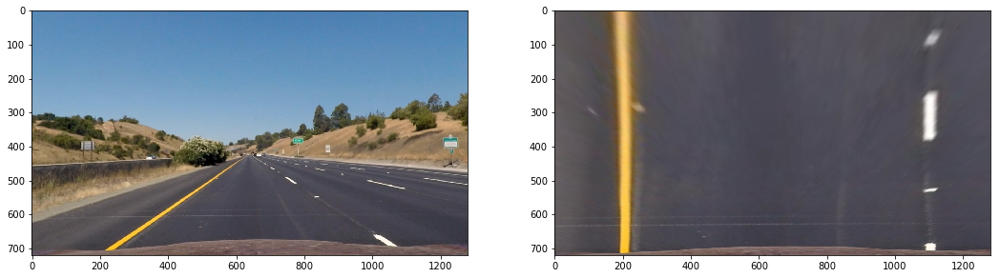

In [5]:
# Perspective Transform
# Play with an example image
img = cv2.imread('./test_images/straight_lines1.jpg')
img_size = (img.shape[1], img.shape[0])
undist = undistort(img, verbose=0)

# src = np.int32([[[733, 480], [555, 480], 
#                  [200, 720], [1102, 720]]])

src = np.int32([[[716, 470], [568, 470], 
                 [200, 720], [1102, 720]]])
marked_undist = undistort(img, verbose=0)
cv2.polylines(marked_undist, src, True, [255, 0, 0], thickness=2)
plt.figure(figsize=(18,10))
plt.imshow(cv2.cvtColor(marked_undist, cv2.COLOR_BGR2RGB))
plt.plot(716, 470, '.')
plt.plot(568, 470, '.')
plt.plot(200, 720, '.')
plt.plot(1102, 720, '.')

# src = np.float32([[733, 480], [555, 480], 
#                   [200, 720], [1102, 720]])
# dst = np.float32([[1102, 0], [200, 0], 
#                   [200, 720], [1102, 720]])

src = np.float32([[716, 470], [568, 470], 
                  [200, 720], [1102, 720]])
dst = np.float32([[1102, 0], [200, 0], 
                  [200, 720], [1102, 720]])
M = cv2.getPerspectiveTransform(src, dst)
warped = cv2.warpPerspective(undist, M, img_size)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))
ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))

./test_images/test2.jpg
./test_images/test5.jpg
./test_images/straight_lines1.jpg
./test_images/test3.jpg
./test_images/test4.jpg
./test_images/test6.jpg
./test_images/test1.jpg
./test_images/straight_lines2.jpg


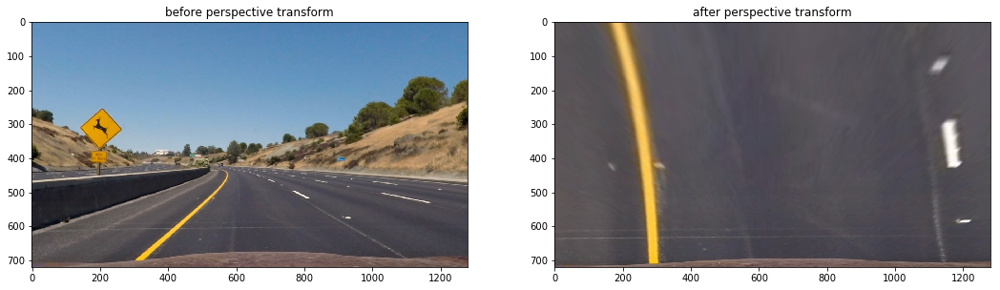

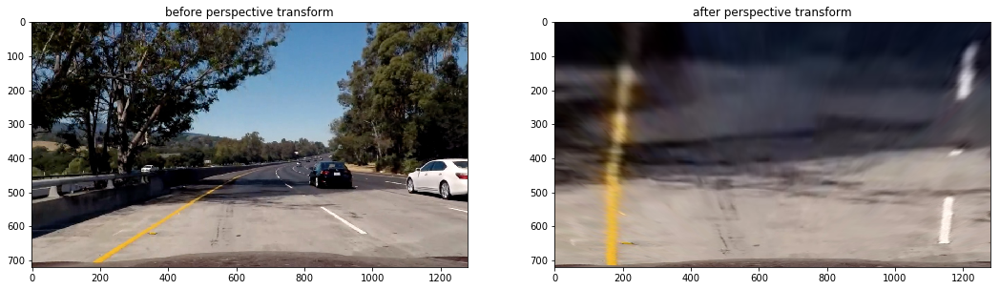

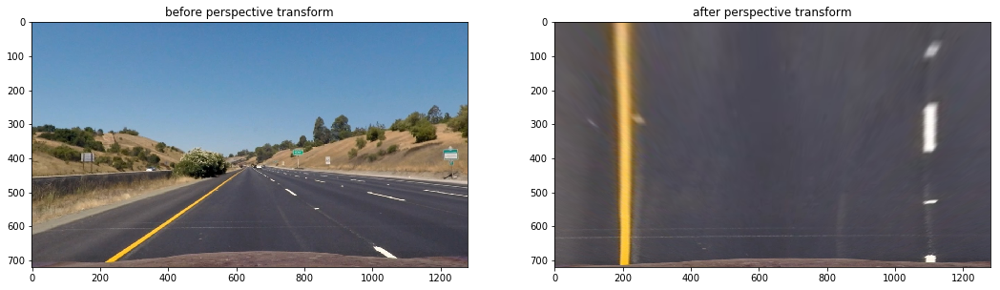

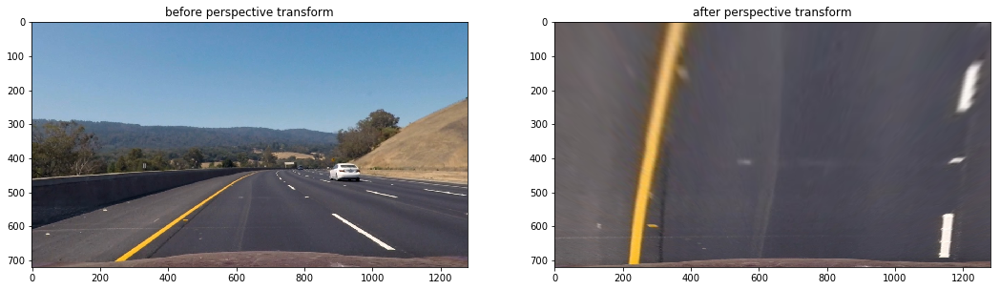

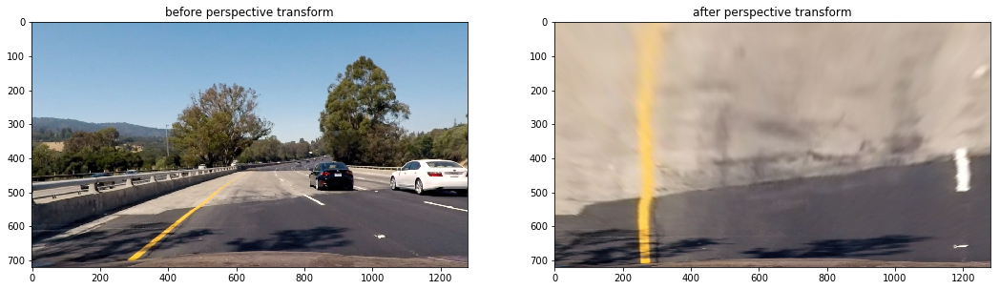

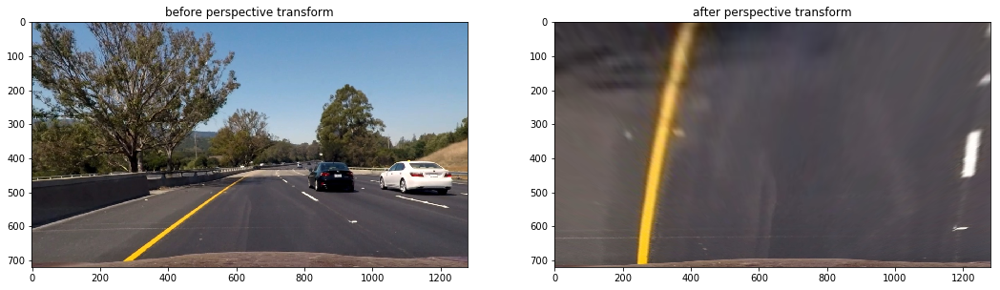

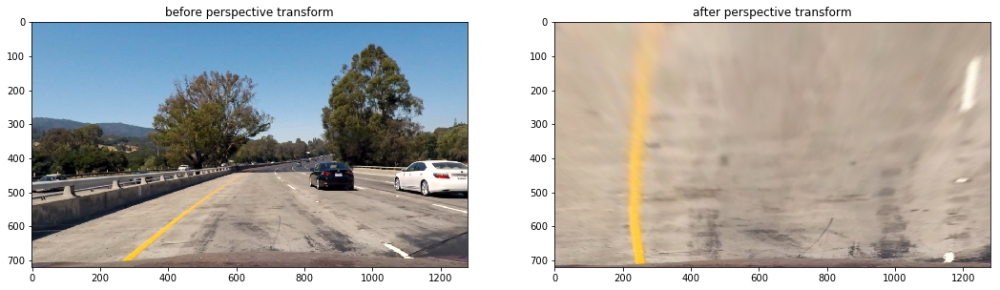

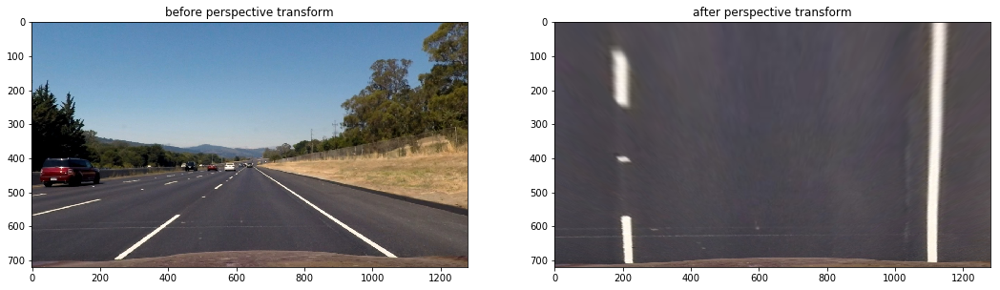

In [6]:
def perspective_transform(img, verbose=1):
  img_size = (img.shape[1], img.shape[0])
#   src = np.float32([[733, 480], [555, 480], 
#                     [200, 720], [1102, 720]])
#   dst = np.float32([[1102 - 10, 0], [200 + 10, 0], 
#                     [200, 720], [1102, 720]])
  
  src = np.float32([[716, 470], [568, 470], 
                  [200, 720], [1102, 720]])
  dst = np.float32([[1102, 0], [200, 0], 
                  [200, 720], [1102, 720]])
  M = cv2.getPerspectiveTransform(src, dst)
  warped = cv2.warpPerspective(img, M, img_size)
  
  if verbose == 1:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('before perspective transform')
    ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
    ax2.set_title('after perspective transform')

  return warped

imgs = glob.glob('./test_images/*.jpg')
for filepath in imgs:
  print(filepath)
  img = cv2.imread(filepath)
  undist = undistort(img, verbose=0)
  perspective_transform(undist)

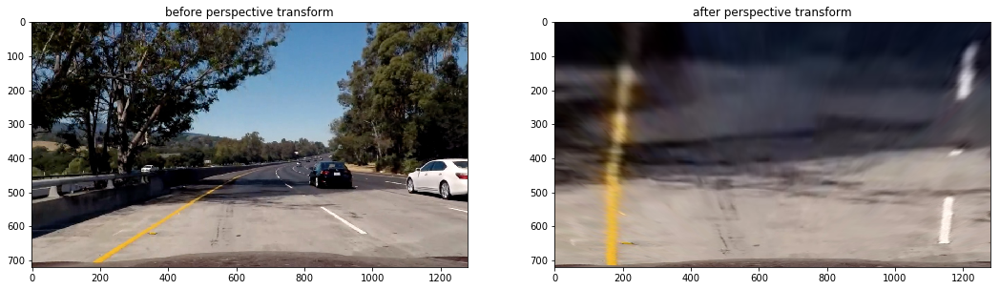

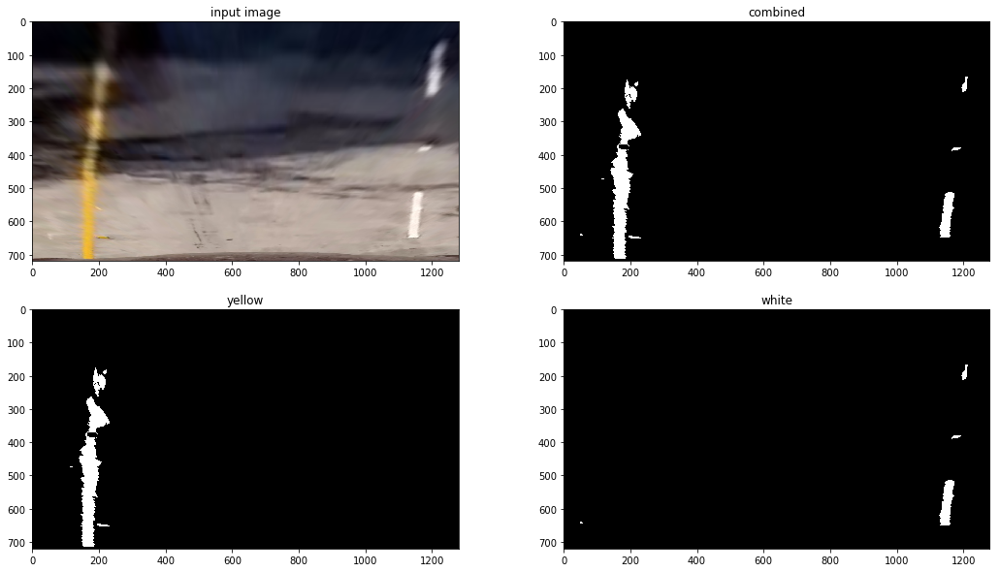

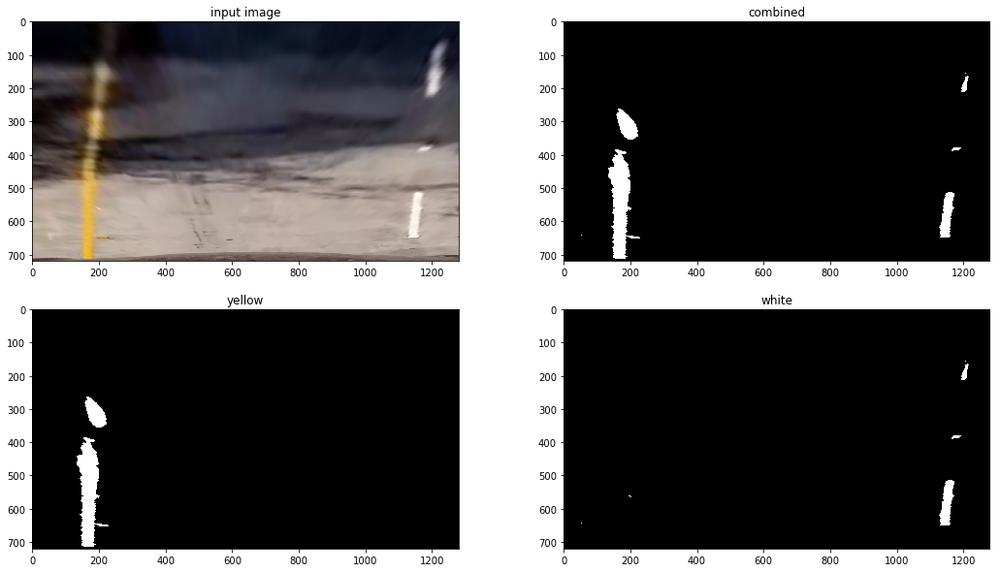

In [7]:
# Thresholding
def abs_sobel_thresh(img, orient='x', thresh=(0, 255)):
  thresh_min, thresh_max = thresh
    
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  if orient == 'x':
    abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
  if orient == 'y':
    abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
        
  scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
  binary_output = np.zeros_like(scaled_sobel)
  binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
  return binary_output
  
def mag_thresh(img, sobel_kernel=3, thresh=(0, 255)):
  thresh_min, thresh_max = thresh
  
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
  sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
  gradmag = np.sqrt(sobelx**2 + sobely**2)
  scaled_gradmag = np.uint8(255 * gradmag / np.max(gradmag))
  binary_output = np.zeros_like(scaled_gradmag)
  binary_output[(scaled_gradmag >= thresh_min) & (scaled_gradmag <=thresh_max)] = 1

  return binary_output

def dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
  thresh_min, thresh_max = thresh
  
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
  sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
  abs_graddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
  binary_output = np.zeros_like(abs_graddir)
  binary_output[(abs_graddir >= thresh_min) & (abs_graddir <= thresh_max)] = 1
  
  return binary_output

def HSV_thresh(img, color_space='BGR', verbose=1):
  if color_space == 'BGR':
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
  elif color_space == 'RGB':
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
  lower_yellow = np.array([18, 100, 100])
  upper_yellow = np.array([42, 255, 255])
  yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)
    
  lower_white = np.array([0, 0, 215])
  upper_white = np.array([180, 40, 255])
  white_mask = cv2.inRange(hsv, lower_white, upper_white)

  combined_mask = cv2.bitwise_or(yellow_mask, white_mask)
    
  if verbose == 1:
    f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(18, 10))
    if color_space == 'BGR':
      ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    elif color_space == 'RGB':
      ax1.imshow(img)
    ax1.set_title('input image')
    ax2.imshow(combined_mask, cmap='gray')
    ax2.set_title('combined')
    ax3.imshow(yellow_mask, cmap='gray')
    ax3.set_title('yellow')
    ax4.imshow(white_mask, cmap='gray')
    ax4.set_title('white')
  return combined_mask


# Lab_thresh can be used for detecting yellow and white
# https://en.wikipedia.org/wiki/Lab_color_space
# L for lightness and a and b for the color opponents green–red and blue–yellow
def Lab_thresh(img, color_space='BGR', verbose=1):
  if color_space == 'BGR':
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
  elif color_space == 'RGB':
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)

  # yellow
  b_channel = lab[:,:,2]
  b_binary = np.zeros_like(b_channel)
  b_binary[b_channel >= 155] = 1

  # white
  l_channel = lab[:,:,0]
  l_binary = np.zeros_like(l_channel)
  l_binary[l_channel >= 210] = 1

  combined_binary = cv2.bitwise_or(b_binary, l_binary)
  if verbose == 1:
    f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(18, 10))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('input image')
    ax2.imshow(combined_binary, cmap='gray')
    ax2.set_title('combined')
    ax3.imshow(b_binary, cmap='gray')
    ax3.set_title('yellow')
    ax4.imshow(l_binary, cmap='gray')
    ax4.set_title('white')

  return combined_binary
    

img = cv2.imread('./test_images/test5.jpg')
undist = undistort(img, verbose=0)
warped = perspective_transform(undist)
# grad_binary = abs_sobel_thresh(warped, 'x', thresh=(20, 100))
# grad_binary = mag_thresh(warped, sobel_kernel=3, thresh=(20, 100))
# grad_binary = dir_thresh(warped, sobel_kernel=3, thresh=(0.1, 0.3))
color_binary = HSV_thresh(warped)
color_binary = Lab_thresh(warped)

./test_images/test2.jpg
./test_images/test5.jpg
./test_images/straight_lines1.jpg
./test_images/test3.jpg
./test_images/test4.jpg
./test_images/test6.jpg
./test_images/test1.jpg
./test_images/straight_lines2.jpg


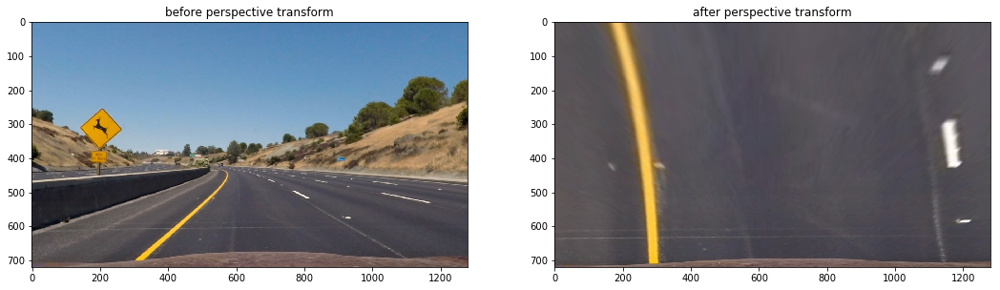

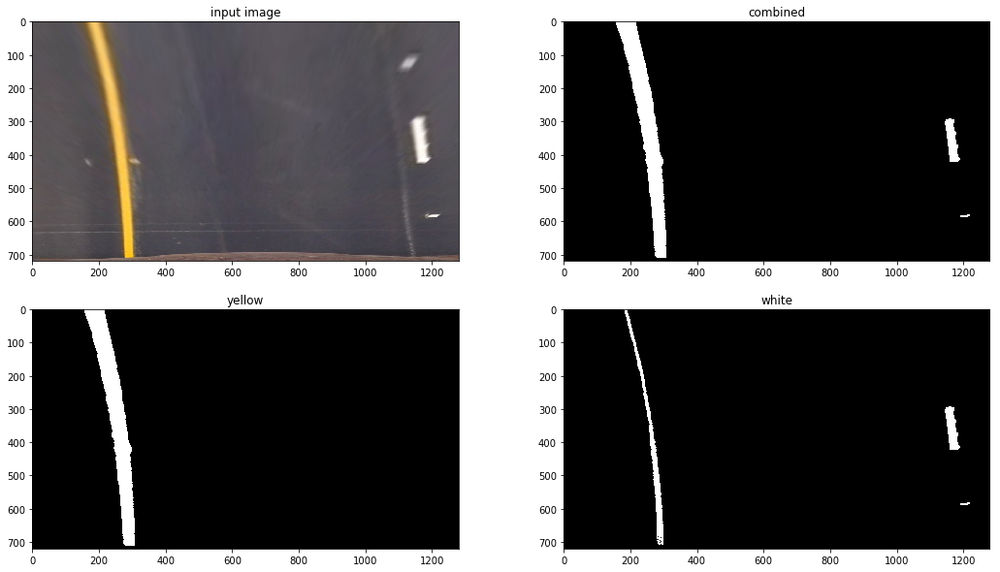

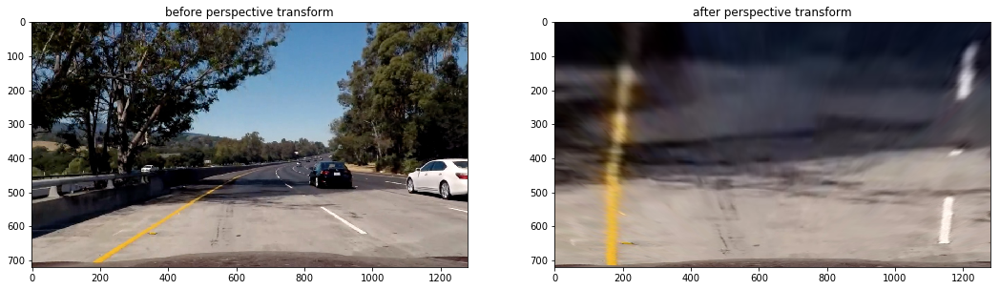

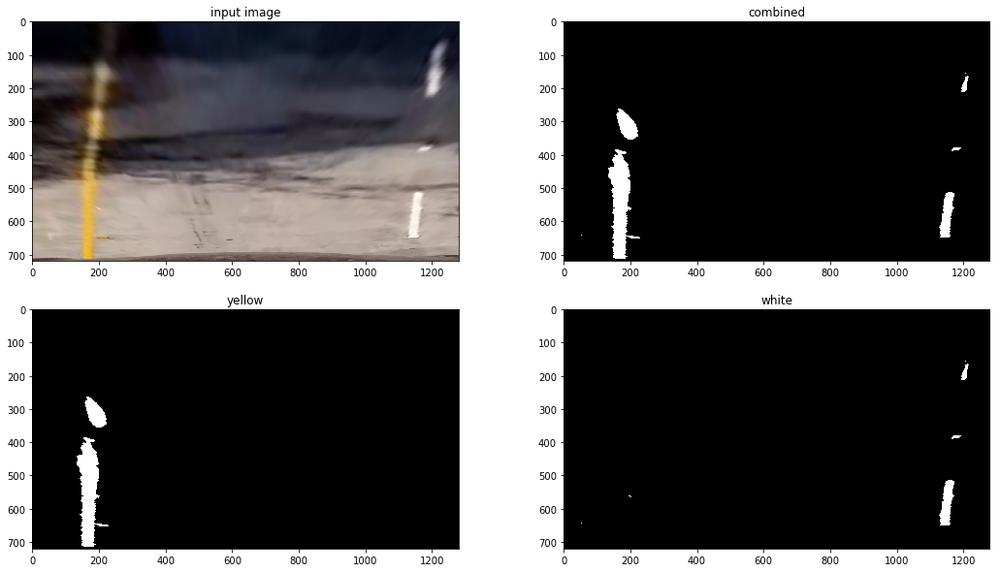

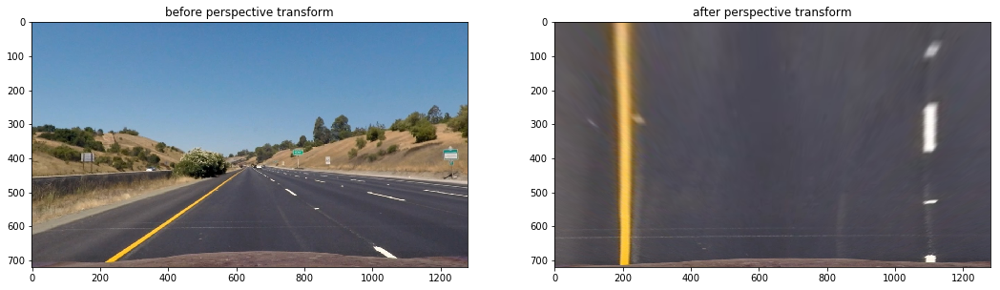

...

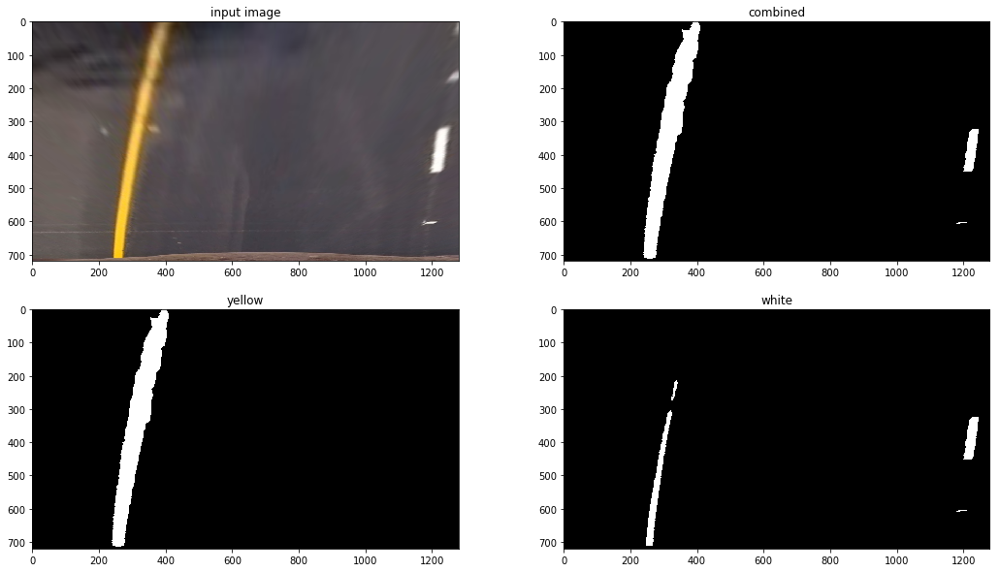

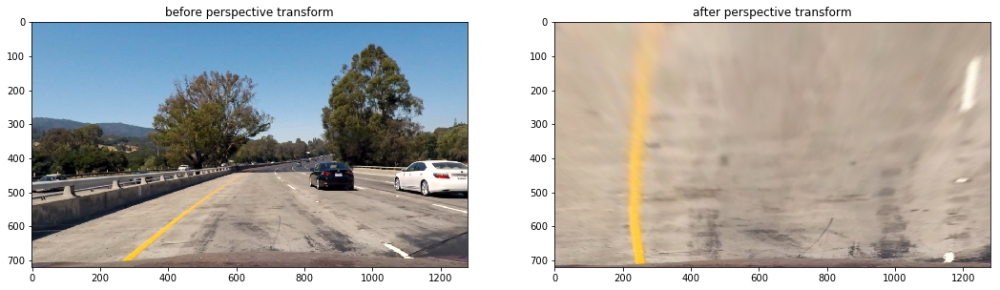

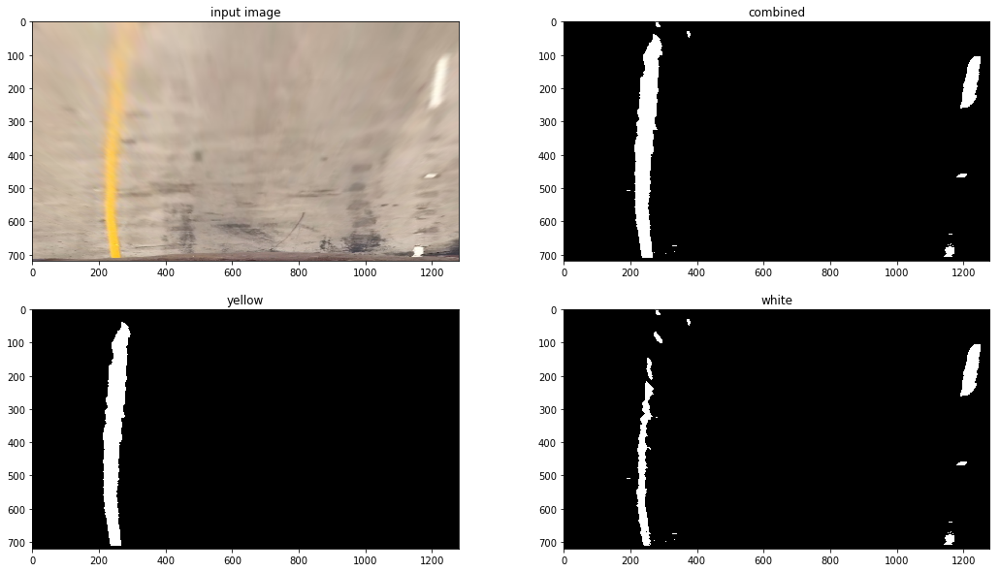

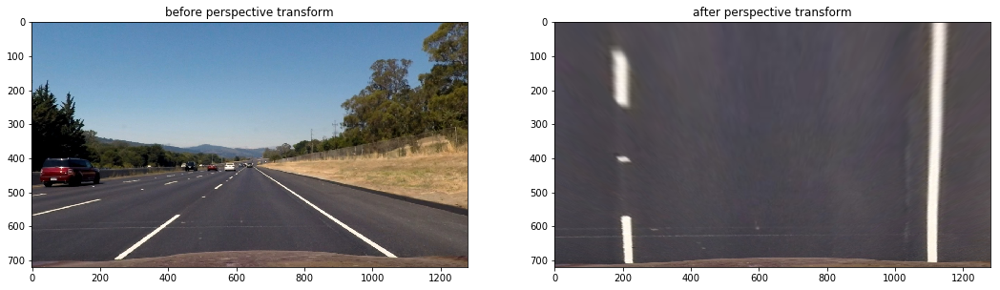

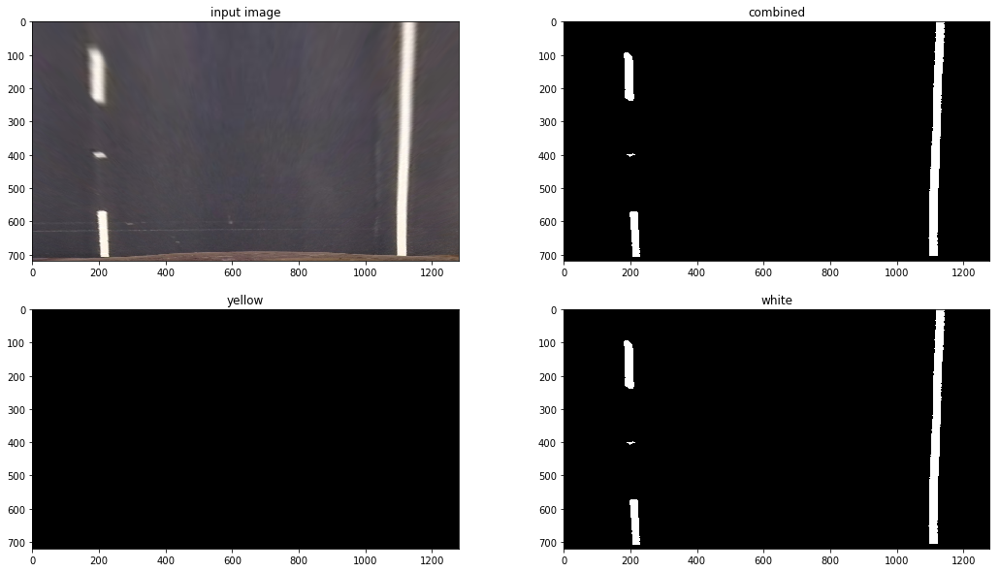

In [8]:
imgs = glob.glob('./test_images/*.jpg')
for filepath in imgs:
  print(filepath)
  img = cv2.imread(filepath)
  undist = undistort(img, verbose=0)
  warped = perspective_transform(undist)
  Lab_thresh(warped)

./test_images/test2.jpg
./test_images/test5.jpg
./test_images/straight_lines1.jpg
./test_images/test3.jpg
./test_images/test4.jpg
./test_images/test6.jpg
./test_images/test1.jpg
./test_images/straight_lines2.jpg


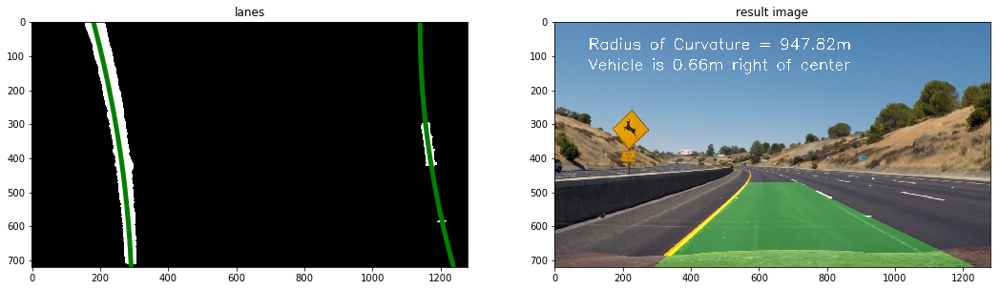

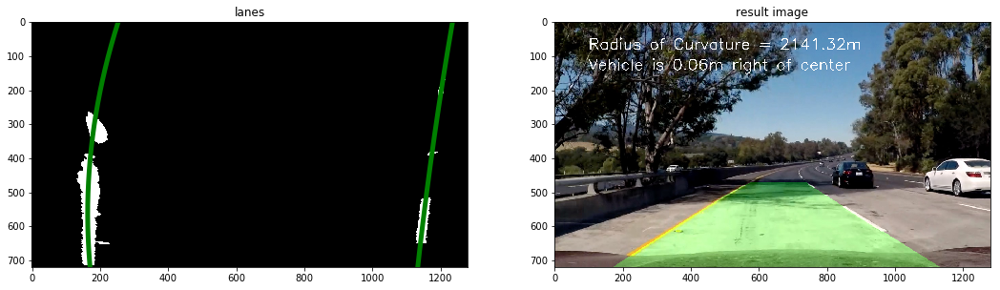

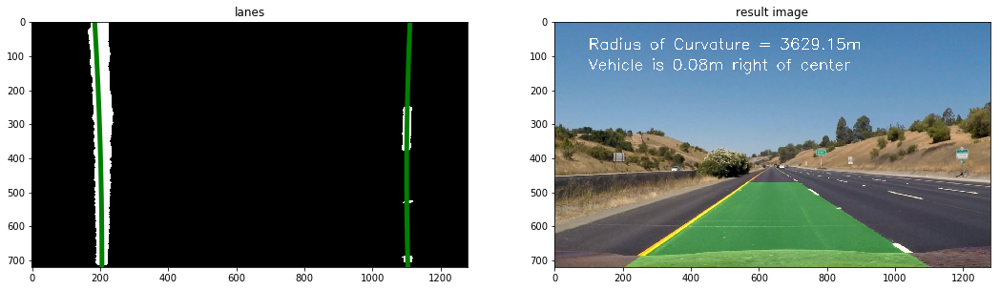

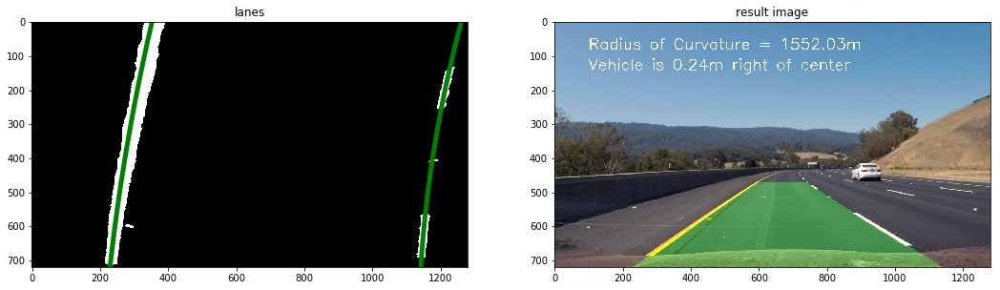

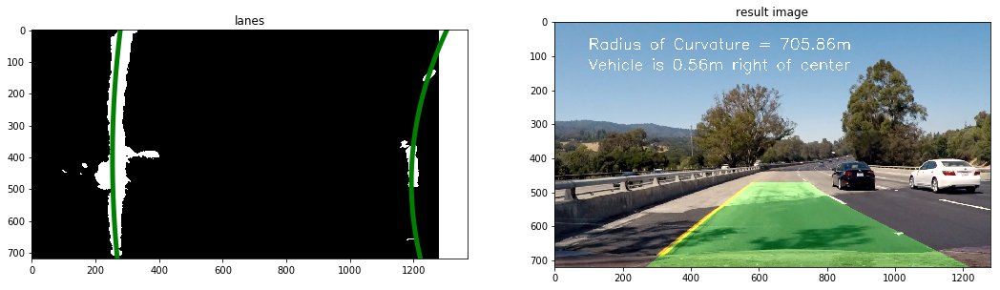

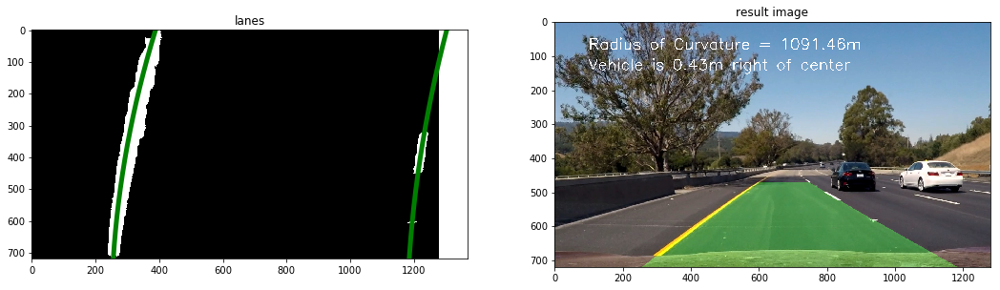

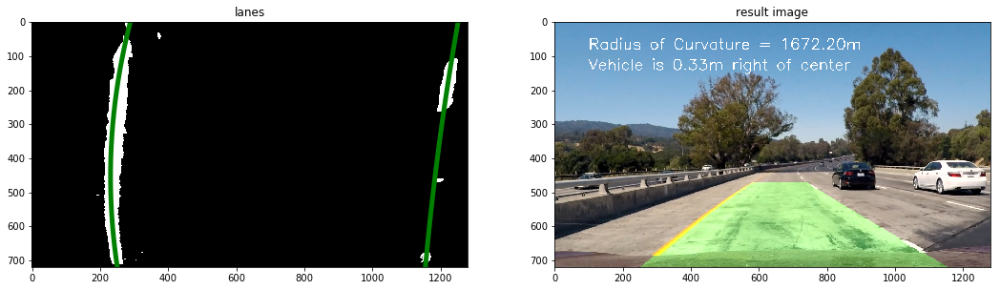

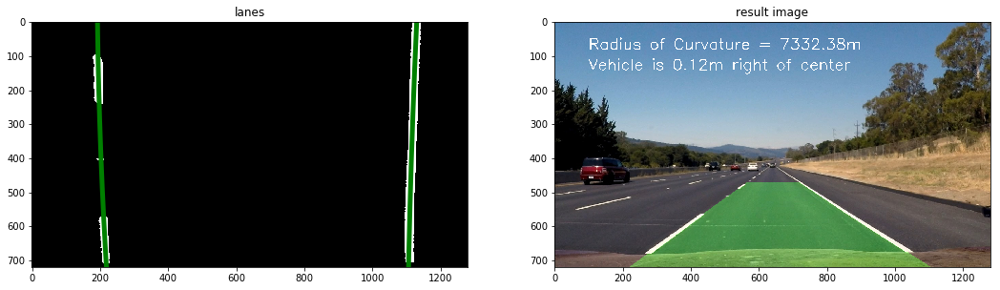

In [9]:
# Curvature
def fit_polynomial(binary_img, wh=80, margin=30):
  '''
  wh: window height
  margin: window width / 2
  '''
  leftx, lefty, rightx, righty = [], [], [], []

  (width, height) = (binary_img.shape[1], binary_img.shape[0])
  mid = width // 2
  y, x = binary_img.nonzero()
  for ymin in range(height-wh, 0, -wh):
    histogram = np.sum(binary_img[ymin:ymin+wh, :], axis=0)
    left_peak = np.argmax(histogram[:mid])
    right_peak = np.argmax(histogram[mid:]) + mid
    
    # For left
    idx = np.where((x > (left_peak-margin)) & (x < (left_peak+margin)) & (y > ymin) & (y < ymin+wh))
    x_values, y_values = x[idx], y[idx]
    if len(idx) > 0:
      leftx.extend(x_values)
      lefty.extend(y_values)
        
    # For right
    idx = np.where((x > (right_peak-margin)) & (x < (right_peak+margin)) & (y > ymin) & (y < ymin+wh))
    x_values, y_values = x[idx], y[idx]
    if len(idx) > 0:
      rightx.extend(x_values)
      righty.extend(y_values)
  
  try: 
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
  except:
    return False, ([], []), ([], []), ([], [])
  
  return True, (leftx, lefty), (rightx, righty), (left_fit, right_fit)

def calc_curvature(pointsX, pointsY, y_eval):
  # calculate curvature
  # http://www.intmath.com/applications-differentiation/8-radius-curvature.php
  (leftx, lefty) = pointsX
  (rightx, righty) = pointsY

  ym_per_pix = 30/720 # meters per pixel in y dimension
  xm_per_pix = 3.7/700 # meters per pixel in x dimension
  left_fit_cr = np.polyfit(np.array(lefty)*ym_per_pix, np.array(leftx)*xm_per_pix, 2)
  right_fit_cr = np.polyfit(np.array(righty)*ym_per_pix, np.array(rightx)*xm_per_pix, 2)
  left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
  right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
  
  return left_curverad, right_curverad

def calc_car_offset(img_w, img_h, fits):
  # calculate car offset
  mid, height = img_w // 2, img_h
  (left_fit, right_fit) = fits
  xm_per_pix = 3.7/700 # meters per pixel in x dimension

  left_startx = left_fit[0] * (height-1)**2 + left_fit[1] * (height-1) + left_fit[2]
  right_startx = right_fit[0] * (height-1)**2 + right_fit[1] * (height-1) + right_fit[2]
  offset = (mid - (left_startx + right_startx)/2) * xm_per_pix
  return offset

def process_lane(org_img, binary_img, verbose=1):
  (width, height) = (binary_img.shape[1], binary_img.shape[0])
  ret, pointsX, pointsY, fits = fit_polynomial(binary_img)
  if not ret:
    return org_img
  
  left_fit, right_fit = fits
  leftr, rightr = calc_curvature(pointsX, pointsY, height-1)
  offset = calc_car_offset(width, height, fits)
  

#   src = np.float32([[733, 480], [555, 480], 
#                     [200, 720], [1102, 720]])
#   dst = np.float32([[1102 - 10, 0], [200 + 10, 0], 
#                     [200, 720], [1102, 720]])
  src = np.float32([[716, 470], [568, 470], 
                  [200, 720], [1102, 720]])
  dst = np.float32([[1102, 0], [200, 0], 
                  [200, 720], [1102, 720]])
  Minv = cv2.getPerspectiveTransform(dst, src)
  
  # For plotting the curve
  ploty = np.linspace(0, height-1, height)
  left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
  right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]
    
  warp_zero = np.zeros_like(binary_img).astype(np.uint8)
  color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
  pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
  pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
  pts = np.hstack((pts_left, pts_right))
  cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

  newwarp = cv2.warpPerspective(color_warp, Minv, (width, height)) 
  result = cv2.addWeighted(org_img, 1, newwarp, 0.3, 0)
  cv2.putText(result, 'Radius of Curvature = {:.2f}m'.format((leftr+rightr)/2.0), 
              (100, 80), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1.5, color=(255, 255, 255),
              thickness=2)
  if offset >= 0:
    cv2.putText(result, 'Vehicle is {:.2f}m left of center'.format(offset),
                (100, 140), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1.5, color=(255, 255, 255),
                thickness=2)
  else:
    cv2.putText(result, 'Vehicle is {:.2f}m right of center'.format(-offset),
                (100, 140), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1.5, color=(255, 255, 255),
                thickness=2)
  if verbose == 1:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10)) 
    ax1.imshow(binary_img, cmap='gray')
    ax1.plot(left_fitx, ploty, color='green', linewidth=5)
    ax1.plot(right_fitx, ploty, color='green', linewidth=5)
    ax1.set_title('lanes')
    
    ax2.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    ax2.set_title('result image')
    
  return result
    
    
imgs = glob.glob('./test_images/*.jpg')
for filepath in imgs:
  print(filepath)
  img = cv2.imread(filepath)
  undist = undistort(img, verbose=0)
  warped = perspective_transform(undist, verbose=0)
  binary_img = Lab_thresh(warped, verbose=0)
  result = process_lane(img, binary_img, verbose=1)
#   plt.figure()
#   plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))

In [10]:
# At this point, we can define our function for 
# processing images in video.
def process_video_img(img):
  undist = undistort(img, verbose=0)
  warped = perspective_transform(undist, verbose=0)
  binary_img = Lab_thresh(warped, color_space='RGB', verbose=0)
  result = process_lane(img, binary_img, verbose=0)
  
  return result

In [11]:
# Purely use the code above can cause non-stable detection.
# A better idea is to define a line class to track some detection
# history.
class Line:
  def __init__(self, width, height, is_left=True, n=10):
    # is this left line or right line?
    self.is_left = is_left
    # the image width
    self.width = width
    # the image height
    self.height = height
    # was the line detected in the last iteration?
    self.detected = False

    # polynomial coefficients for the most recent fit
    self.current_fit = [np.array([False])] 
    #x values for detected line pixels
    self.allx = None  
    #y values for detected line pixels
    self.ally = None
    #radius of curvature of the line in some units
    self.radius = None
    
    self.n = n
    self.last_nfits = deque(maxlen=n)
    
    # x values of the last n fits of the line
    self.recent_xfitted = [] 
    #average x values of the fitted line over the last n iterations
    self.bestx = None     
    #polynomial coefficients averaged over the last n iterations
    self.best_fit = None
    
  def detected_search(self, binary_img, wh=80, margin=20):
    linex, liney = [], []
    
    (width, height) = (binary_img.shape[1], binary_img.shape[0])
    y, x = binary_img.nonzero()
    best_fit = np.mean(self.last_nfits, axis=0)
    for ymin in range(height-wh, 0, -wh):
      ypos = (ymin + ymin+wh) / 2.0
      xpos = best_fit[0] * ypos**2 + best_fit[1] * ypos + best_fit[2]
      
      idx = np.where((x > (xpos-margin)) & (x < (xpos+margin)) & (y > ymin) & (y < ymin+wh))
      x_values, y_values = x[idx], y[idx]
      if len(idx) > 0:
        linex.extend(x_values)
        liney.extend(y_values)
        
    if len(linex) > 0:
      self.detected = True
      self.allx, self.ally = linex, liney
      self.current_fit = np.polyfit(liney, linex, 2)
      self.last_nfits.append(copy.deepcopy(self.current_fit))
      
    else:
      self.detected = False
      self.blind_search(binary_img)
      
      
  def blind_search(self, binary_img,  wh=80, margin=20):
    linex, liney = [], []

    (width, height) = (binary_img.shape[1], binary_img.shape[0])
    mid = width // 2
    y, x = binary_img.nonzero()
    for ymin in range(height-wh, 0, -wh):
      histogram = np.sum(binary_img[ymin:ymin+wh, :], axis=0)
      if self.is_left:
        peak = np.argmax(histogram[:mid])
      else:
        peak = np.argmax(histogram[mid:]) + mid

      idx = np.where((x > (peak-margin)) & (x < (peak+margin)) & (y > ymin) & (y < ymin+wh))
      x_values, y_values = x[idx], y[idx]
      if len(idx) > 0:
        linex.extend(x_values)
        liney.extend(y_values)
    
    if len(linex) > 0:
        self.detected = True
        self.allx, self.ally = linex, liney
        self.current_fit = np.polyfit(liney, linex, 2)
        self.last_nfits.append(copy.deepcopy(self.current_fit))
    else:
        self.detected = False  # self.current_fit will be kept as the last fit
        self.last_nfits.append(copy.deepcopy(self.current_fit))
    
    
  def calc_curvature(self, y_eval):
    # calculate curvature
    # http://www.intmath.com/applications-differentiation/8-radius-curvature.php
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    fit_cr = np.polyfit(np.array(self.ally)*ym_per_pix, np.array(self.allx)*xm_per_pix, 2)
    
    self.radius = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    
    return self.radius
    

In [12]:
def process_left_right_line(org_img, binary_img, verbose=1):
  (width, height) = (binary_img.shape[1], binary_img.shape[0])

  # search lines
  if (not left_line.detected) or (left_line.n == 0):
    left_line.blind_search(binary_img)
  else:
    left_line.detected_search(binary_img)
    
  if (not right_line.detected) or (right_line.n == 0):
    right_line.blind_search(binary_img)
  else:
    right_line.detected_search(binary_img)
    
  left_fit, right_fit = left_line.current_fit, right_line.current_fit
  
  # calculate curvature
  leftr = left_line.calc_curvature(height-1)
  rightr = right_line.calc_curvature(height-1)
  
  # calculate offset
  offset = calc_car_offset(width, height, (left_fit, right_fit))
  
#   src = np.float32([[733, 480], [555, 480], 
#                     [200, 720], [1102, 720]])
#   dst = np.float32([[1102 - 10, 0], [200 + 10, 0], 
#                     [200, 720], [1102, 720]])

  src = np.float32([[716, 470], [568, 470], 
                  [200, 720], [1102, 720]])
  dst = np.float32([[1102, 0], [200, 0], 
                  [200, 720], [1102, 720]])
  Minv = cv2.getPerspectiveTransform(dst, src)
  
  # For plotting the curve
  ploty = np.linspace(0, height-1, height)
  left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
  right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]
    
  warp_zero = np.zeros_like(binary_img).astype(np.uint8)
  color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
  pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
  pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
  pts = np.hstack((pts_left, pts_right))
  cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
  
  newwarp = cv2.warpPerspective(color_warp, Minv, (width, height)) 
  result = cv2.addWeighted(org_img, 1, newwarp, 0.3, 0)
  cv2.putText(result, 'Radius of Curvature = {:.2f}m'.format((leftr+rightr)/2.0), 
              (100, 80), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1.5, color=(255, 255, 255),
              thickness=2)
    
  if offset >= 0:
    cv2.putText(result, 'Vehicle is {:.2f}m left of center'.format(offset),
                (100, 140), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1.5, color=(255, 255, 255),
                thickness=2)
  else:
    cv2.putText(result, 'Vehicle is {:.2f}m right of center'.format(-offset),
                (100, 140), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1.5, color=(255, 255, 255),
                thickness=2)
  if verbose == 1:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10)) 
    ax1.imshow(binary_img, cmap='gray')
    ax1.plot(left_fitx, ploty, color='green', linewidth=5)
    ax1.plot(right_fitx, ploty, color='green', linewidth=5)
    ax1.set_title('lanes')
    
    ax2.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    ax2.set_title('result image')
    
  return result

In [13]:
def process_video_img_v2(img):
  undist = undistort(img, verbose=0)
  warped = perspective_transform(undist, verbose=0)
  binary_img = Lab_thresh(warped, color_space='RGB', verbose=0)
  result = process_left_right_line(img, binary_img, verbose=0)
  
  return result

In [14]:
# Process the video
# For debugging purpose, to get each image, use this for loop
# for frame in clip.iter_frames():
left_line = Line(1280, 720, is_left=True, n=0)
right_line = Line(1280, 720, is_left=False, n=0)
video_input = 'project_video.mp4'
video_output = 'result1.mp4'
clip = VideoFileClip(video_input)
out_clip = clip.fl_image(process_video_img_v2)
out_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video result1.mp4
[MoviePy] Writing video result1.mp4


100%|█████████▉| 1260/1261 [01:58<00:00, 10.64it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: result1.mp4 

